# Project Analysis - Geomechanical Properties of Rock
Lily Kingston

The target for this analysis is going to the Total Porosity and the question or what we want to know is how to minimize the total porosity of a rock and what factors affect that occuring. I will be exploring models to predict the data to help understand it better. 

In [1]:
import pandas as pd
import numpy as np
# importing the dataset 

rockdata = pd.read_csv(r'C:\Users\lilye\OneDrive\Desktop\Data Science\Geomechanical_Properties_of_Rock.csv')
rockdata 

,Unnamed: 0,Depth,Resistivity,Gamma Ray,Total Porosity,Effective Porosity,Bulk Density,Compression Wave Travel Time,Shear Wave Travel Time
0,0,6805.0,57.47087,110.47838,0.03449,0.00445,2.76576,67.67523,124.05187
1,1,6805.5,58.85637,112.94601,0.03716,0.00775,2.76560,67.74464,123.80700
2,2,6806.0,65.01717,114.49005,0.03828,0.00976,2.75550,67.75224,123.40514
3,3,6806.5,63.35363,116.06593,0.03364,0.00568,2.74892,67.71935,123.23686
4,4,6807.0,62.28267,117.68179,0.03199,0.00340,2.75687,67.69218,123.43977
...,...,...,...,...,...,...,...,...,...
1899,1899,7754.5,658.59399,52.87986,0.00709,0.00621,2.69998,52.17642,90.09988
1900,1900,7755.0,2887.57812,41.62927,0.00400,0.00306,2.70699,51.94688,88.39143
1901,1901,7755.5,5068.73682,36.78852,0.00287,0.00212,2.71437,51.45436,87.12267
1902,1902,7756.0,1797.73010,34.76611,0.00591,0.00569,2.71223,50.93727,86.78609


## Exploratory Data Analysis
I am using the pandas profiling report to gain insight on the variables and dataset. 

In [2]:
from pandas_profiling import ProfileReport
profilereport = ProfileReport(rockdata)
profilereport

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

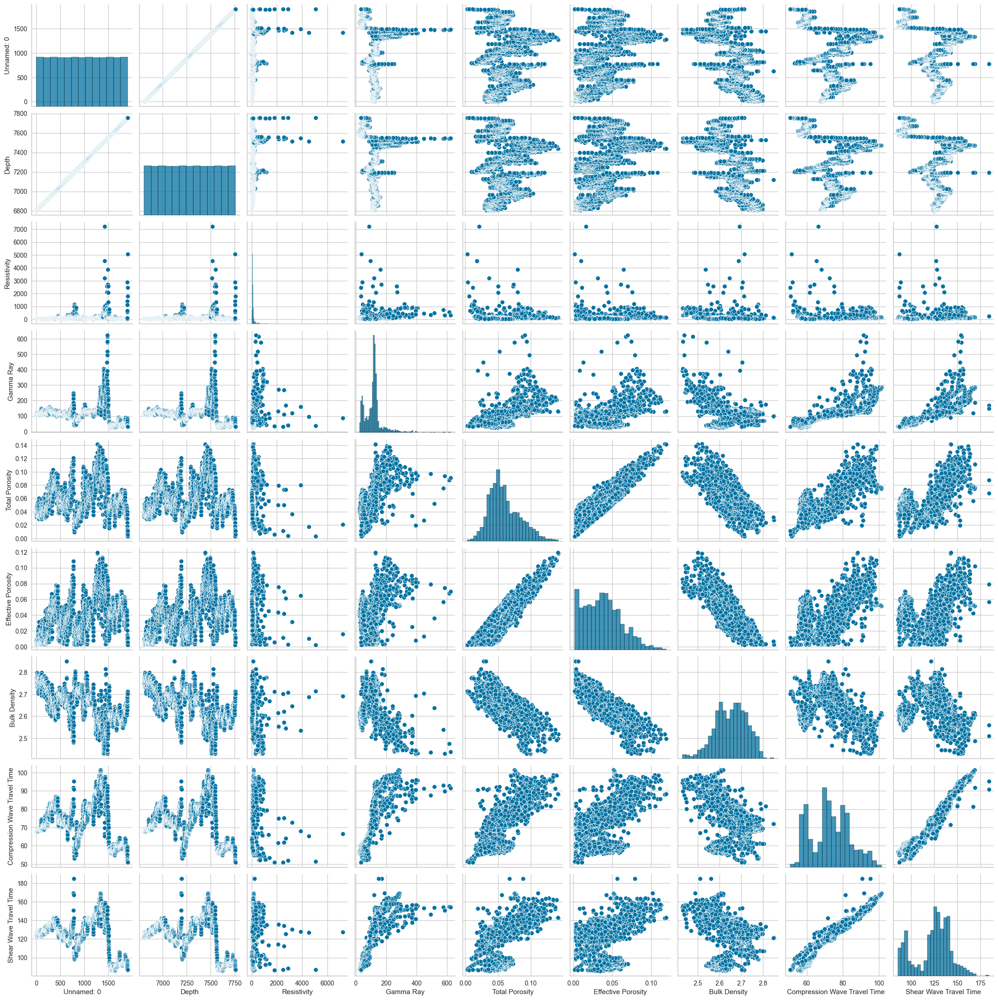

In [89]:
import seaborn as sns
sns.pairplot(data=rockdata)


In [5]:
# cleaning up the data and reducing the number of features and get rid of irrelevant data 
rockdata_new = rockdata.drop(['Depth', 'Unnamed: 0', 'Gamma Ray', 'Effective Porosity'], axis=1)
rockdata_new

,Resistivity,Total Porosity,Bulk Density,Compression Wave Travel Time,Shear Wave Travel Time
0,57.47087,0.03449,2.76576,67.67523,124.05187
1,58.85637,0.03716,2.76560,67.74464,123.80700
2,65.01717,0.03828,2.75550,67.75224,123.40514
3,63.35363,0.03364,2.74892,67.71935,123.23686
4,62.28267,0.03199,2.75687,67.69218,123.43977
...,...,...,...,...,...
1899,658.59399,0.00709,2.69998,52.17642,90.09988
1900,2887.57812,0.00400,2.70699,51.94688,88.39143
1901,5068.73682,0.00287,2.71437,51.45436,87.12267
1902,1797.73010,0.00591,2.71223,50.93727,86.78609


For this dataset we do not have categorical data, so the target and features will be numerical data. When looking at the pandas profile to help understand the data, I observed the Pearson's r coefficient and the Spearman's p coefficient. I found that total porosity and effective porosity were closely correlated so I decided to only keep one of the features. Depth, Gamma Ray, and Unnamed features were irrelevant to this analysis so I dropped them.
The target is going to Total Porosity, I am curious about what results in low total porosity. 

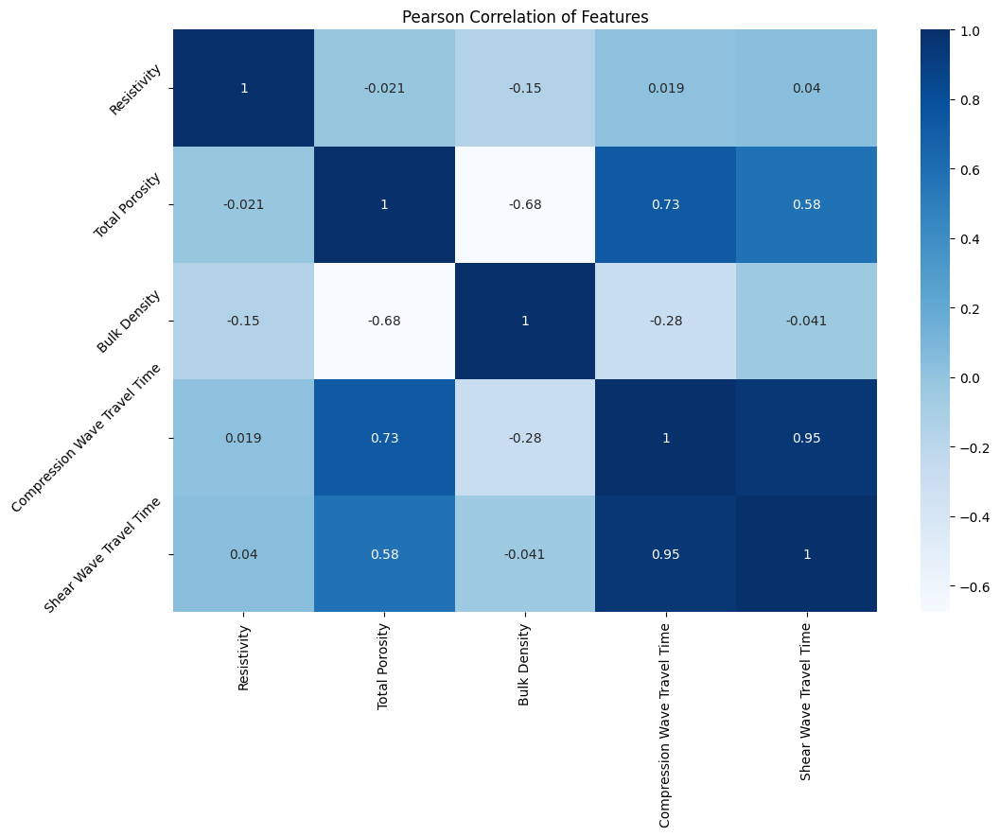

In [6]:
# Defining Features and Targets
features = rockdata_new.drop(['Total Porosity'], axis=1)
target = rockdata_new[['Total Porosity']]

import matplotlib.pyplot as plt
import seaborn as sns
corr = rockdata_new.corr()

f, ax = plt.subplots(figsize=(12, 8))

sns.heatmap(corr, cmap="Blues", annot=True, square=False, ax=ax)
plt.title('Pearson Correlation of Features')
plt.yticks(rotation=45)
plt.show()

Compression wave travel time and shear wave travel time are highly correlated features

In [7]:
from sklearn import preprocessing
from sklearn import utils
import numpy as np

#convert y values to categorical values
lab = preprocessing.LabelEncoder()
y_transformed = lab.fit_transform(target)
 


C:\Users\lilye\anaconda3\envs\newbase\lib\site-packages\sklearn\preprocessing\_label.py:115: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


I will remove compression wave travel time feature, since also it is very closely correlated to the Shear wave travel time.

In [8]:
rockdata_clean = rockdata_new.drop(['Compression Wave Travel Time'], axis=1)

features_clean = rockdata_clean.drop(['Total Porosity'], axis=1)
target_clean = rockdata_clean[['Total Porosity']]
#target_transformed = lab.fit_transform(target_clean)

rockdata_clean

,Resistivity,Total Porosity,Bulk Density,Shear Wave Travel Time
0,57.47087,0.03449,2.76576,124.05187
1,58.85637,0.03716,2.76560,123.80700
2,65.01717,0.03828,2.75550,123.40514
3,63.35363,0.03364,2.74892,123.23686
4,62.28267,0.03199,2.75687,123.43977
...,...,...,...,...
1899,658.59399,0.00709,2.69998,90.09988
1900,2887.57812,0.00400,2.70699,88.39143
1901,5068.73682,0.00287,2.71437,87.12267
1902,1797.73010,0.00591,2.71223,86.78609


## Training the Dataset

In [9]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(features_clean, target_clean)

### Linear Regression

In [90]:
# Standardize the training features
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression


scaler = StandardScaler()
scaled_features_train = scaler.fit_transform(x_train)
scaled_features_test = scaler.fit_transform(x_test)

scaled_lr = LinearRegression()
scaled_lr.fit(scaled_features_train, y_train)
print('R2 Value Linear Regression Train Data:', scaled_lr.score(scaled_features_train, y_train))


R2 Value Linear Regression Train Data: 0.7700220487751346


In [92]:
from sklearn.metrics import r2_score
# making prediction for SSPL with the linear model and x test data
predict_testdat = scaled_lr.predict(scaled_features_test)
# prediction for train set
predict_traindat = scaled_lr.predict(scaled_features_train)

# quantify the R2 and MSE using the training and test sets
r2_score_train = r2_score(y_train,scaled_lr.predict(scaled_features_train))
r2_score_test = r2_score(y_test,predict_testdat)
print('Train Dataset R2:', r2_score_train)
print('Test Dataset R2:', r2_score_test)


Train Dataset R2: 0.7700220487751346
Test Dataset R2: 0.8060744785323462


### Mean Squared Error


In [93]:
from sklearn.metrics import mean_squared_error as mse

mse_test = mse(y_test, predict_testdat)
mse_train = mse(y_train, scaled_lr.predict(scaled_features_train))

print('Linear Regression Test Dataset Mean Squared Error:', mse_test)
print('Linear Regression Train Dataset Mean Squared Error:', mse_train)


Linear Regression Test Dataset Mean Squared Error: 0.00011640973496572592
Linear Regression Train Dataset Mean Squared Error: 0.0001266567944139271


#### Plotting the Predicted vs Data

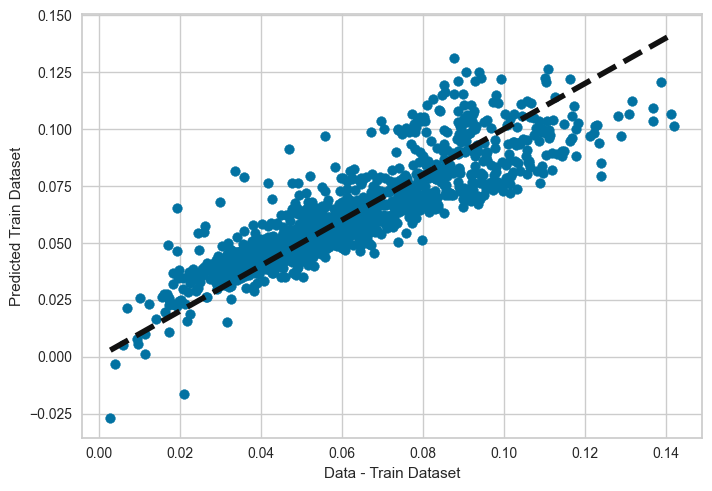

In [94]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
ax.scatter(y_train, predict_traindat)
ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=4)
ax.set_xlabel('Data - Train Dataset')
ax.set_ylabel('Predicted Train Dataset')
plt.show()

#### Random Forest Model

The data does seem to behave linearly, but I wanted to just try out random forest model (decision tree type) just to be sure and to see what the data does. 

In [51]:
# Use random forest model
from sklearn import preprocessing
from sklearn import utils

#convert y values
lab = preprocessing.LabelEncoder()
y_train2 = lab.fit_transform(y_train)
y_test2 = lab.fit_transform(y_test)

from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(max_depth = 10, random_state=42)
rfc.fit(x_train, y_train2)
y_pred_test = rfc.predict(x_test)
y_pred_train = rfc.predict(x_train)
print(rfc.score(x_train, y_train2))

C:\Users\lilye\anaconda3\envs\newbase\lib\site-packages\sklearn\preprocessing\_label.py:115: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.8333333333333334


In [23]:
from sklearn.metrics import mean_absolute_error as mae
mae_test = mae(y_test2, rfc.predict(x_test))
print(mae_test)
mae_train = mae(y_train2, y_pred_train)
print(mae_train)

420.0378151260504
30.12044817927171


The test data mean absolute error being greater than the training data for the random forest model indicates that there is a little bit of overfitting. 

#### Ridge Model 

I wanted to dive further into regression models, so I looked at how the Ridge Model fits the data.

In [11]:
from sklearn.linear_model import RidgeCV
l2_lr = RidgeCV()
l2_lr.fit(x_train, y_train)
print('Alpha:', l2_lr.alpha_)
print('Ridge Test Data R2:', l2_lr.score(x_test, y_test))
print('Ridge Train Data R2:', l2_lr.score(x_train, y_train))

Alpha: 0.1
Ridge Test Data R2: 0.7660240221333868
Ridge Train Data R2: 0.7824390813861557


In [43]:
from sklearn.metrics import mean_absolute_error as mae
mae_test_r = mae(y_test2, l2_lr.predict(x_test))
print('Test Dataset Mean Absolute Error:',mae_test_r)
mae_train_r = mae(y_train2, l2_lr.predict(x_train))
print('Train Dataset Mean Absolute Error:', mae_train_r)

Test Dataset Mean Absolute Error: 228.58277567816324
Train Dataset Mean Absolute Error: 638.8493058893557


In [80]:
from sklearn.metrics import mean_squared_error as mse

mse_test_ridge = mse(y_test, l2_lr.predict(x_test))
mse_train_ridge = mse(y_train, l2_lr.predict(x_train))

print('Ridge Class: Test Dataset Mean Squared Error:', mse_test_ridge)
print('Ridge Class: Train Dataset Mean Squared Error:', mse_train_ridge)

Ridge Class: Test Dataset Mean Squared Error: 0.00011951118420495717
Ridge Class: Train Dataset Mean Squared Error: 0.00012670220770901982


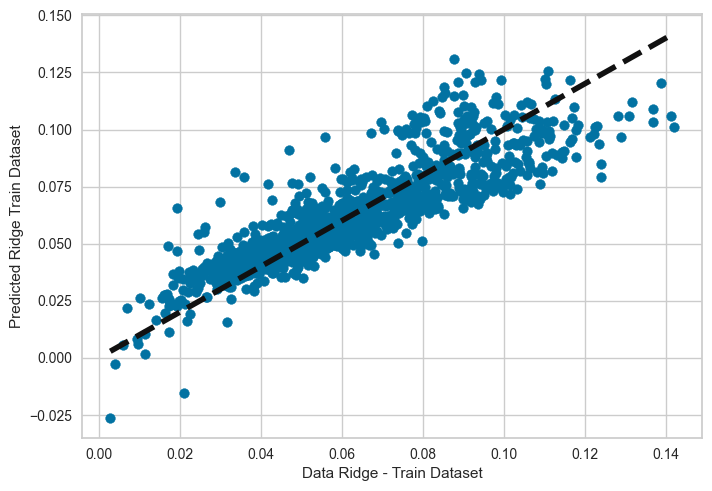

In [79]:
# plotting the training predicted SSPL vs data SSPL

# making prediction for test
rpredict_testdat = l2_lr.predict(x_test)
# prediction for train set
rpredict_traindat = l2_lr.predict(x_train)


fig, ax = plt.subplots()
ax.scatter(y_train, rpredict_traindat)
ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=4)
ax.set_xlabel('Data Ridge - Train Dataset')
ax.set_ylabel('Predicted Ridge Train Dataset')
plt.show()

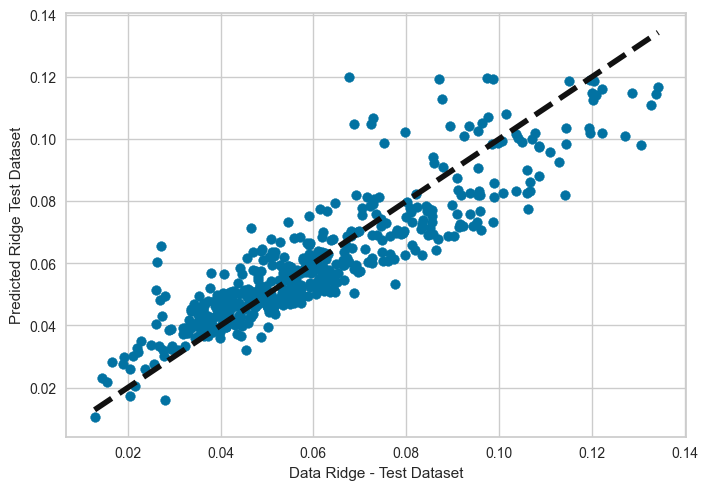

In [88]:
fig, ax = plt.subplots()
ax.scatter(y_test, rpredict_testdat)
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
ax.set_xlabel('Data Ridge - Test Dataset')
ax.set_ylabel('Predicted Ridge Test Dataset')
plt.show()

#### Lasso Model

In [34]:
from sklearn.linear_model import LassoCV
l1_lr = LassoCV()
l1_lr.fit(x_train, y_train)
print('Alpha:', l1_lr.alpha_)
print('R2:', l1_lr.score(x_test, y_test))

Alpha: 0.0003819689060611525
R2: 0.7337352581093926


C:\Users\lilye\anaconda3\envs\newbase\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:1614: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


#### KNN for Regression

In [12]:
from sklearn.neighbors import KNeighborsRegressor
knr = KNeighborsRegressor()
knr.fit(x_train, y_train)
print('KNN Train Data R2:', knr.score(x_train, y_train))
print('KNN Test Data R2:', knr.score(x_test, y_test))



KNN Train Data R2: 0.7446641409896801
KNN Test Data R2: 0.5726245719220002


There is some overfitting using the KNN for regression method since the test score is less than the training score. 

KNN: Test Dataset Mean Squared Error: 0.00023983603766386554
KNN: Train Dataset Mean Squared Error: 0.00014289765296638657


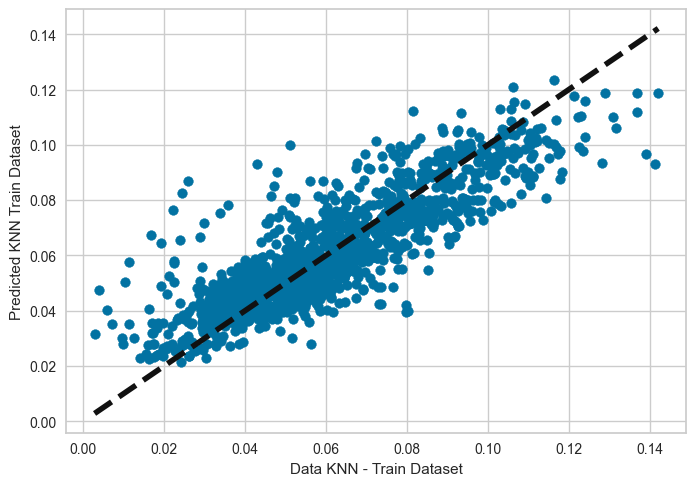

In [85]:
# making prediction for test
kpredict_testdat = knr.predict(x_test)
# prediction for train set
kpredict_traindat = knr.predict(x_train)


# MSE for KNN fit
mse_test_knn = mse(y_test, kpredict_testdat)
mse_train_knn = mse(y_train, kpredict_traindat)

print('KNN: Test Dataset Mean Squared Error:', mse_test_knn)
print('KNN: Train Dataset Mean Squared Error:', mse_train_knn)

# plotting the training predicted SSPL vs data SSPL
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
ax.scatter(y_train, kpredict_traindat)
ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=4)
ax.set_xlabel('Data KNN - Train Dataset')
ax.set_ylabel('Predicted KNN Train Dataset')
plt.show()

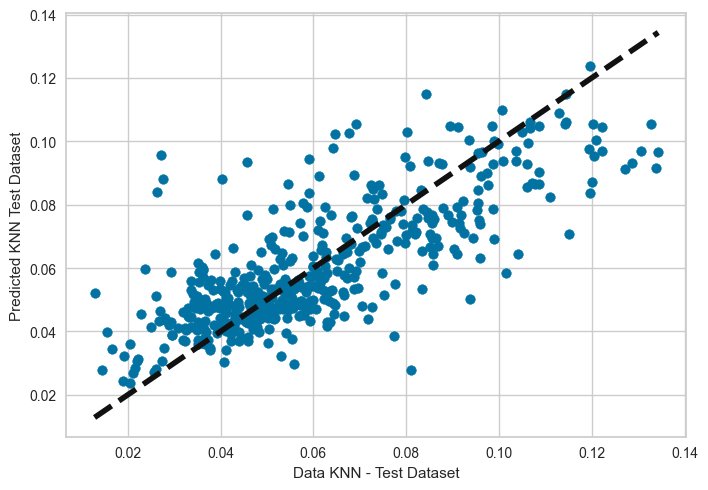

In [86]:
# plotting the test predicted SSPL vs data SSPL
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
ax.scatter(y_test, kpredict_testdat)
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
ax.set_xlabel('Data KNN - Test Dataset')
ax.set_ylabel('Predicted KNN Test Dataset')
plt.show()

### Hyperparameter Tuning

For KNR :

In [13]:
hyperparameters = {'n_neighbors': [1, 3],
                  'weights': ['uniform', 'distance'], 
                       'p': [1,2] }

from sklearn.model_selection import GridSearchCV
gs = GridSearchCV(knr, 
                 hyperparameters, 
                 scoring='neg_mean_absolute_error',
                 n_jobs=-1)
gs.fit(features, target)

GridSearchCV(estimator=KNeighborsRegressor(), n_jobs=-1,
             param_grid={'n_neighbors': [1, 3], 'p': [1, 2],
                         'weights': ['uniform', 'distance']},
             scoring='neg_mean_absolute_error')

In [14]:
print(gs.best_estimator_)
print(gs.best_params_)
print(gs.best_score_)

KNeighborsRegressor(n_neighbors=3)
{'n_neighbors': 3, 'p': 2, 'weights': 'uniform'}
-0.016235229281208272
